# Predictive Model for Heart Disease Detection

**Done by:** Nga Wei En + _____ + _____

### Project Objective

The primary objective of this project is to develop a predictive model that can accurately predict the presence of heart disease in individuals. The model will leverage various data points including lifestyle choices, health factors, and biodemographic information. By integrating these diverse datasets, the aim is to identify key predictors of heart disease and to create a robust tool that healthcare professionals can use to assess risk levels in patients.

This model seeks to bridge the gap between routine medical data collection and proactive patient care management, providing a valuable resource for both preventative health strategies and for tailoring specific interventions for those at increased risk.


## Import Necessary Library

In [1]:
import pandas as pd 
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rc_context

from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
from sklearn import tree

from sklearn.model_selection import train_test_split
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import StandardScaler 
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, auc, precision_recall_curve, average_precision_score
from sklearn.metrics import precision_score, recall_score, f1_score, roc_auc_score

from sklearn.model_selection import StratifiedKFold

from tensorflow import keras
from tensorflow.keras import layers

from scipy.stats import chi2_contingency, pointbiserialr, chi2_contingency

from sklearn.base import BaseEstimator, ClassifierMixin
from eli5.sklearn import PermutationImportance
import eli5

from  imblearn.over_sampling import KMeansSMOTE

import warnings    
warnings.filterwarnings("ignore")

plt.style.use("default")


In [2]:
#plt.style.use("Solarize_Light2")

---

## Setup : Import the Dataset

Dataset from Kaggle : `Indicators of Heart Disease`

Source: https://www.kaggle.com/datasets/kamilpytlak/personal-key-indicators-of-heart-disease/data 

In [3]:
df = pd.read_csv('data.csv')
df.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,No,16.60,Yes,No,No,3.0,30.0,No,Female,55-59,White,Yes,Yes,Very good,5.0,Yes,No,Yes
1,No,20.34,No,No,Yes,0.0,0.0,No,Female,80 or older,White,No,Yes,Very good,7.0,No,No,No
2,No,26.58,Yes,No,No,20.0,30.0,No,Male,65-69,White,Yes,Yes,Fair,8.0,Yes,No,No
3,No,24.21,No,No,No,0.0,0.0,No,Female,75-79,White,No,No,Good,6.0,No,No,Yes
4,No,23.71,No,No,No,28.0,0.0,Yes,Female,40-44,White,No,Yes,Very good,8.0,No,No,No


#### Explanation of the variables of the dataset
1. HeartDisease : Respondents who ever had heart disease. ( Yes or No )
2. BMI : Body Mass Index (BMI).
3. Smoking : Respondents that smoked at least 100 cigarettes in their entire life. ( Yes or No )
4. AlcoholDrinking : Adult men having more than 14 drinks per week & adult women having more than 7 drinks per week. ( Yes or No )
5. Stroke : Respondents who ever had stroke. ( Yes or No )
6. PhysicalHealth : Days during the past 30 days was your physical health(physical illness and injury) not good? ( 0-30 days )
7. MentalHealth : Days during the past 30 days was your mental health not good? ( 0-30 days )
8. DiffWalking : Difficulty walking or climbing stairs. ( Yes or No )
9. Sex : male or female
10. AgeCategory: Fourteen-level age category.
11. Race : Imputed race/ethnicity value.
12. Diabetic : Respondents who ever had diabetes. ( Yes or No )
13. PhysicalActivity : Physical activity or exercise during the past 30 days other than their regular job. ( Yes or No )
14. GenHealth : Would you say that in general your health is...
15. SleepTime : Average hours of sleep in a 24-hour period.
16. Asthma : Respondents who ever had asthma. ( Yes or No )
17. KidneyDisease : Respondents who ever had kidney disease. ( Yes or No )
18. SkinCancer : Respondents who ever had skin cancer. ( Yes or No )

---

## Clean the Dataset

## Data Cleaning Process

The data cleaning process involved several key steps to ensure the quality and reliability of the data for subsequent analysis. Below are the actions taken:

1. **Remove Duplicates**
   - All duplicate entries were identified and removed from the dataset to ensure the uniqueness of each data point.

2. **Remove Outliers with IQR**
   - Outliers were identified and removed using the Interquartile Range (IQR) method. This approach involved calculating the IQR for each numeric attribute and removing entries that lay beyond 1.5 times the IQR from the first and third quartiles.

3. **Label Encoding & Type Casting**
   - Categorical variables were converted to a numeric format using label encoding to facilitate their use in mathematical models.
   - Data types were adjusted (type casting) to ensure that each attribute in the dataset was represented by the most appropriate data type 

In [4]:
df.describe()

,BMI,PhysicalHealth,MentalHealth,SleepTime
count,319795.000000,319795.00000,319795.000000,319795.000000
mean,28.325399,3.37171,3.898366,7.097075
std,6.356100,7.95085,7.955235,1.436007
min,12.020000,0.00000,0.000000,1.000000
25%,24.030000,0.00000,0.000000,6.000000
50%,27.340000,0.00000,0.000000,7.000000
75%,31.420000,2.00000,3.000000,8.000000
max,94.850000,30.00000,30.000000,24.000000


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319795 entries, 0 to 319794
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   HeartDisease      319795 non-null  object 
 1   BMI               319795 non-null  float64
 2   Smoking           319795 non-null  object 
 3   AlcoholDrinking   319795 non-null  object 
 4   Stroke            319795 non-null  object 
 5   PhysicalHealth    319795 non-null  float64
 6   MentalHealth      319795 non-null  float64
 7   DiffWalking       319795 non-null  object 
 8   Sex               319795 non-null  object 
 9   AgeCategory       319795 non-null  object 
 10  Race              319795 non-null  object 
 11  Diabetic          319795 non-null  object 
 12  PhysicalActivity  319795 non-null  object 
 13  GenHealth         319795 non-null  object 
 14  SleepTime         319795 non-null  float64
 15  Asthma            319795 non-null  object 
 16  KidneyDisease     31

#### Remove Duplicates

In [6]:
duplicate_rows = df[df.duplicated(keep=False)]
df= df.drop_duplicates()
total_duplicate_count = duplicate_rows.groupby(list(df.columns)).size().sum()
print("Number of duplicates:\n", total_duplicate_count)

Number of duplicates:
 29930


#### Remove Outliers with IQR

##### Before Remove

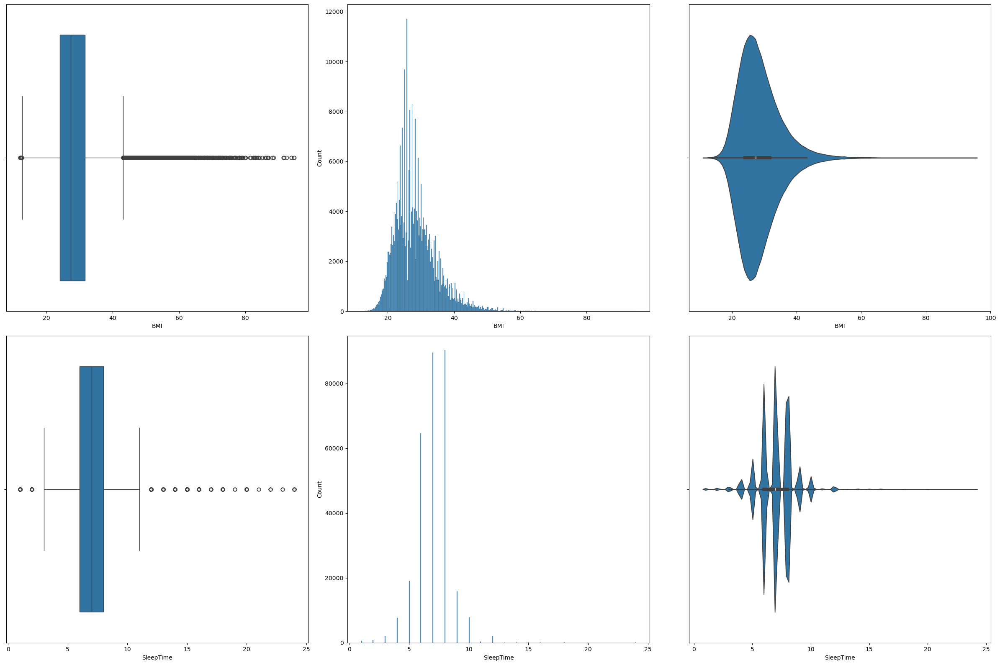

In [7]:
# Extract the relevant numeric variables
numData = df[['BMI', 'SleepTime']].reset_index(drop=True)

f, axes = plt.subplots(2, 3, figsize=(24, 16))

# Iterate over each column to plot
for i, col in enumerate(numData.columns):
    sns.boxplot(data = numData[col], orient = "h", ax = axes[i,0])
    sns.histplot(data = numData[col], ax = axes[i,1])
    sns.violinplot(data = numData[col], orient = "h", ax = axes[i,2])

plt.tight_layout()
plt.show()

In [8]:
def calculate_outliers(series):
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return ((series < lower_bound) | (series > upper_bound))

# Calculating the number of outliers for each variable
outliers_count = {var: calculate_outliers(numData[var]).sum() for var in numData.columns[:]}  

# Calculating skewness for each variable
skewness = numData.skew()

# Display the results
print("Outliers count per variable:", outliers_count)
print("\nSkewness per variable:\n", skewness)

Outliers count per variable: {'BMI': 8905, 'SleepTime': 4542}

Skewness per variable:
 BMI          1.297737
SleepTime    0.697224
dtype: float64


In [9]:
# Creating a mask for outliers in any of the columns
outlier_mask = numData.apply(calculate_outliers).any(axis=1)
rows_before = df.shape[0]

# Dropping the outliers from the DataFrame
numData_cleaned = numData[~outlier_mask]
df = df.reset_index(drop=True)
df = df[~outlier_mask]

# Number of rows before and after removing outliers
rows_after = df.shape[0]

print("Rows before: " + str(rows_before) + "\nRows After: " + str(rows_after))
print("Rows removed " + str(rows_before - rows_after))

Rows before: 301717
Rows After: 288496
Rows removed 13221


##### After Remove

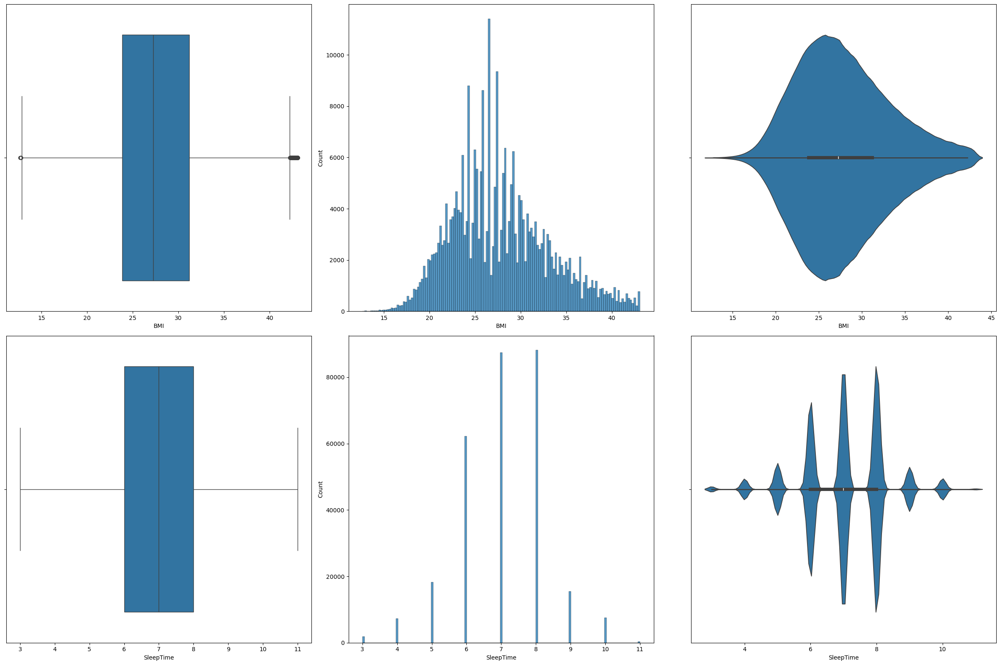

In [10]:
# Extract the relevant numeric variables
numData = numData_cleaned[['BMI', 'SleepTime']]

f, axes = plt.subplots(2, 3, figsize=(24, 16))

# Iterate over each column to plot
for i, col in enumerate(numData.columns):
    sns.boxplot(data = numData[col], orient = "h", ax = axes[i,0])
    sns.histplot(data = numData[col], ax = axes[i,1])
    sns.violinplot(data = numData[col], orient = "h", ax = axes[i,2])

plt.tight_layout()
plt.show()


#### Type Casting

Changing Yes to 1 and No to 0

In [11]:
df =  df[df.columns].replace({'Yes':1, 'No':0, 'Male':1,'Female':0,'No, borderline diabetes':'0','Yes (during pregnancy)':'1' })
df['Diabetic'] = df['Diabetic'].astype(int)

#### Label Encoding 

In [12]:
df_clean =  df[df.columns].replace({'18-24':1, '25-29':2, '30-34':3,'35-39':4, '40-44':5, '45-49':6, '50-54':7, '55-59':8, 
                                    '60-64':9, '65-69':10, '70-74':11,'75-79':12, '80 or older':13})

df_clean =  df_clean[df_clean.columns].replace({'White':1,'Hispanic':2,'Black':3,'Asian':4,'Other':5,'American Indian/Alaskan Native':6,
                                                'Excellent':1,'Very good':2,'Good':3,'Fair':4,'Poor':5})

## Exploratory Analysis¶

In [13]:
df_clean.info()

<class 'pandas.core.frame.DataFrame'>
Index: 288496 entries, 0 to 301714
Data columns (total 18 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   HeartDisease      288496 non-null  int64  
 1   BMI               288496 non-null  float64
 2   Smoking           288496 non-null  int64  
 3   AlcoholDrinking   288496 non-null  int64  
 4   Stroke            288496 non-null  int64  
 5   PhysicalHealth    288496 non-null  float64
 6   MentalHealth      288496 non-null  float64
 7   DiffWalking       288496 non-null  int64  
 8   Sex               288496 non-null  int64  
 9   AgeCategory       288496 non-null  int64  
 10  Race              288496 non-null  int64  
 11  Diabetic          288496 non-null  int64  
 12  PhysicalActivity  288496 non-null  int64  
 13  GenHealth         288496 non-null  int64  
 14  SleepTime         288496 non-null  float64
 15  Asthma            288496 non-null  int64  
 16  KidneyDisease     288496 

Cramér's V for HeartDisease vs Smoking: 0.10
Cramér's V for HeartDisease vs AlcoholDrinking: 0.04
Cramér's V for HeartDisease vs Stroke: 0.19
Cramér's V for HeartDisease vs DiffWalking: 0.19
Cramér's V for HeartDisease vs Diabetic: 0.17
Cramér's V for HeartDisease vs PhysicalActivity: 0.09
Cramér's V for HeartDisease vs Asthma: 0.03
Cramér's V for HeartDisease vs KidneyDisease: 0.14
Cramér's V for HeartDisease vs SkinCancer: 0.09


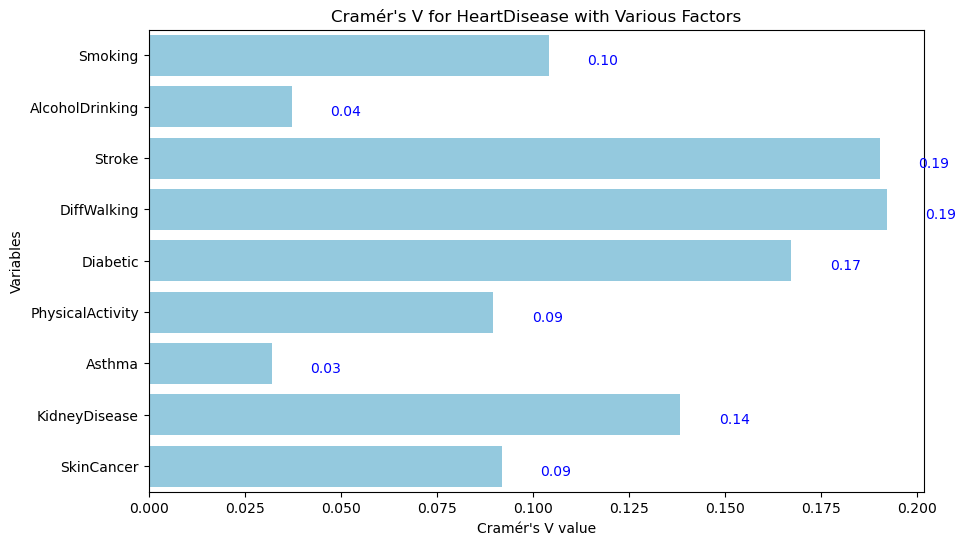

In [14]:
# Function to calculate Cramer's V
def cramers_v(x, y):
    confusion_matrix = pd.crosstab(x, y)
    chi2 = chi2_contingency(confusion_matrix)[0]
    n = confusion_matrix.sum().sum()
    phi2 = chi2 / n
    r, k = confusion_matrix.shape
    phi2corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))
    rcorr = r - ((r-1)**2)/(n-1)
    kcorr = k - ((k-1)**2)/(n-1)
    return np.sqrt(phi2corr / min((kcorr-1), (rcorr-1)))

# Load your data into a DataFrame, assuming it's named df
# df = pd.read_csv('your_data.csv')

# Calculate Cramér's V for each categorical variable against 'HeartDisease'
variables = ['Smoking', 'AlcoholDrinking', 'Stroke', 'DiffWalking', 'Diabetic', 'PhysicalActivity', 'Asthma', 'KidneyDisease', 'SkinCancer']
results = {}

for variable in variables:
    cramer_v_value = cramers_v(df['HeartDisease'], df_clean[variable])
    results[variable] = cramer_v_value

# Print the results
for variable, value in results.items():
    print(f"Cramér's V for HeartDisease vs {variable}: {value:.2F}")


# Visualizing the results
labels = list(results.keys())
values = list(results.values())

plt.figure(figsize=(10, 6))
ax = sns.barplot(x=values, y=labels, color='skyblue')
plt.title('Cramér\'s V for HeartDisease with Various Factors')
plt.xlabel('Cramér\'s V value')
plt.ylabel('Variables')

# Adding the value labels on the bars
for i, v in enumerate(values):
    ax.text(v + 0.01, i + 0.1, f"{v:.2f}", color='blue', va='center')

plt.show()

### Analysis of Cramér's V Values for Heart Disease Association

The following summary explains the strength of association between various factors and the presence of heart disease based on the calculated Cramér's V values:

- **Smoking (0.10)**: Shows a weak association with heart disease, suggesting that smoking may not be a strong predictor in this dataset.
- **Alcohol Drinking (0.04)**: Exhibits a negligible association, indicating that alcohol consumption does not significantly influence heart disease outcomes.
- **Stroke (0.19)**: Indicates a moderate association, suggesting a stronger link between stroke history and heart disease, reflecting common cardiovascular risk factors.
- **DiffWalking (0.19)**: Also shows a moderate association, likely indicating that mobility limitations might be related to poorer cardiovascular health.
- **Diabetic (0.17)**: Demonstrates a moderate association, consistent with diabetes being a known risk factor for heart disease.
- **Physical Activity (0.09)**: Displays a weak association, suggesting that the protective effects of physical activity are not strongly pronounced in this data.
- **Asthma (0.03)**: Reveals a very low association, implying asthma has little impact on heart disease risk in this dataset.
- **Kidney Disease (0.14)**: Shows a moderate association, highlighting potential interactions between renal and cardiovascular health.
- **Skin Cancer (0.09)**: Presents a weak association, indicating that skin cancer has little relevance to heart disease within this group.

#### Conclusion
This analysis helps identify which health and lifestyle factors are more strongly associated with heart disease in the studied population. Factors like stroke, difficulty walking, and diabetes warrant closer attention for their stronger links to heart disease, whereas asthma and alcohol drinking appear to have minimal impact.


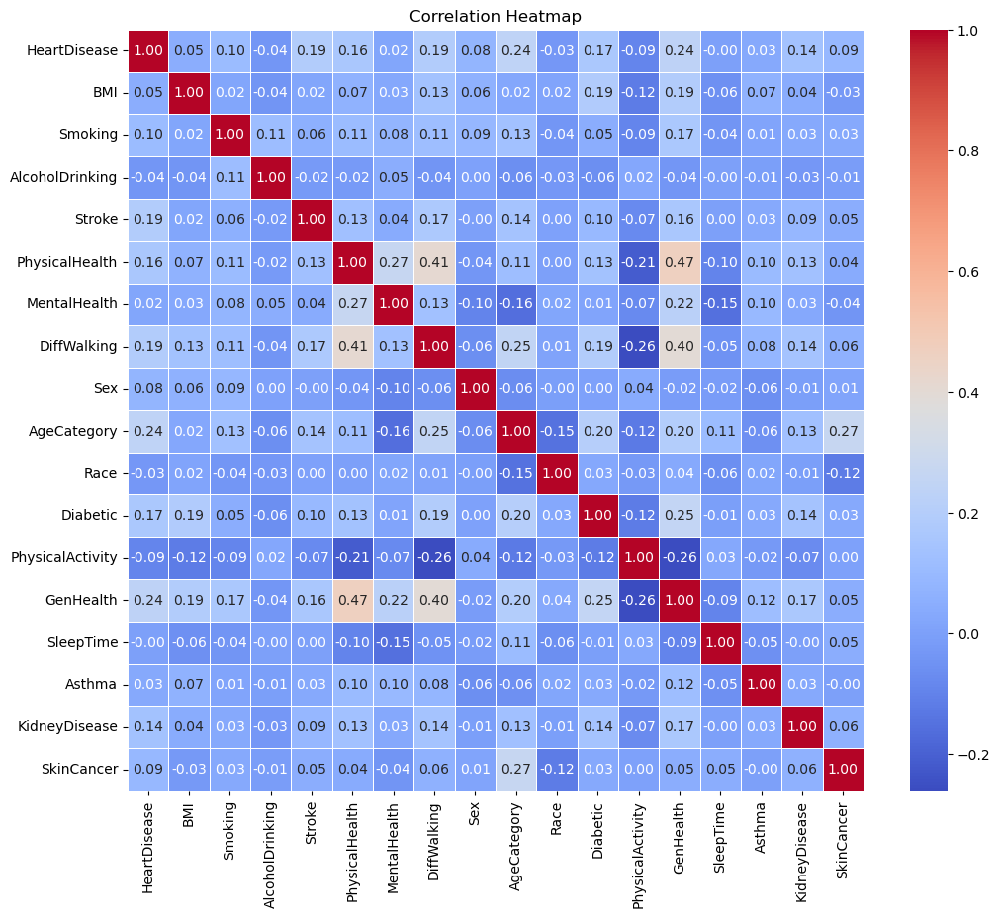

In [15]:
# Select columns of interest
columns_of_interest = ['HeartDisease', 'BMI', 'Smoking', 'AlcoholDrinking', 'Stroke', 'PhysicalHealth', 
                       'MentalHealth', 'DiffWalking', 'Sex', 'AgeCategory', 'Race', 'Diabetic', 
                       'PhysicalActivity', 'GenHealth', 'SleepTime', 'Asthma', 'KidneyDisease', 'SkinCancer']

# Create a subset DataFrame with selected columns
subset_df = df_clean[columns_of_interest]

# Calculate the correlation matrix
correlation_matrix = subset_df.corr()

# Plot heatmap
plt.figure(figsize=(12, 10))
heatmap = sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Heatmap')
plt.show()

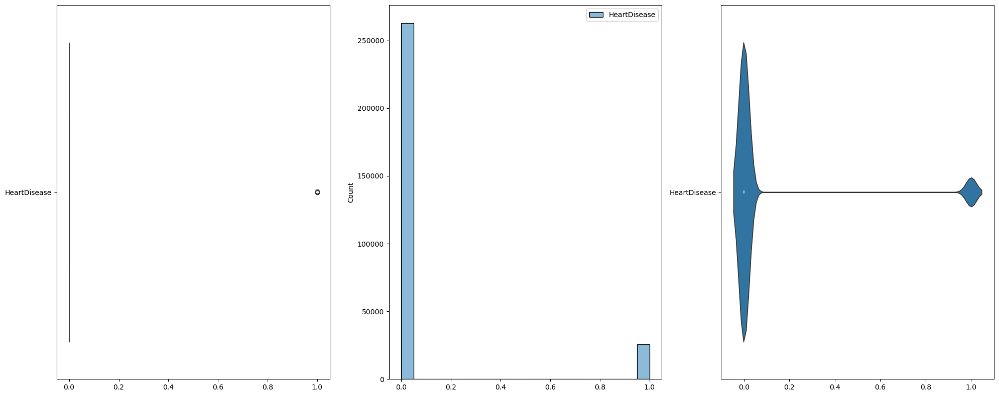

In [16]:
# Extract the relevant numeric variables
numData = df_clean[['HeartDisease']]

f, axes = plt.subplots(1, 3, figsize=(20, 8))  # Adjusted figsize for better layout

sns.boxplot(data=numData, orient="h", ax=axes[0])
sns.histplot(data=numData, ax=axes[1])
sns.violinplot(data=numData, orient="h", ax=axes[2])

plt.tight_layout()
plt.show()

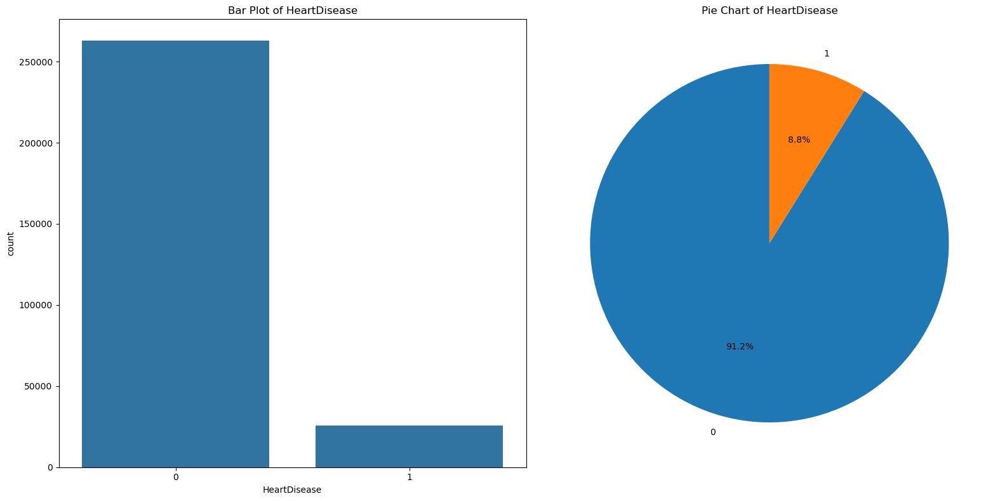

In [17]:
f, axes = plt.subplots(1, 2, figsize=(16, 8))  # Use 2 subplots for bar and pie charts

# Bar plot
sns.countplot(x='HeartDisease', data=df_clean, ax=axes[0])
axes[0].set_title('Bar Plot of HeartDisease')

# Pie chart
heart_disease_counts = df_clean['HeartDisease'].value_counts()
axes[1].pie(heart_disease_counts, labels=heart_disease_counts.index, autopct='%1.1f%%', startangle=90)
axes[1].set_title('Pie Chart of HeartDisease')
axes[1].set_ylabel('')  # Hide the y-label

plt.tight_layout()
plt.show()


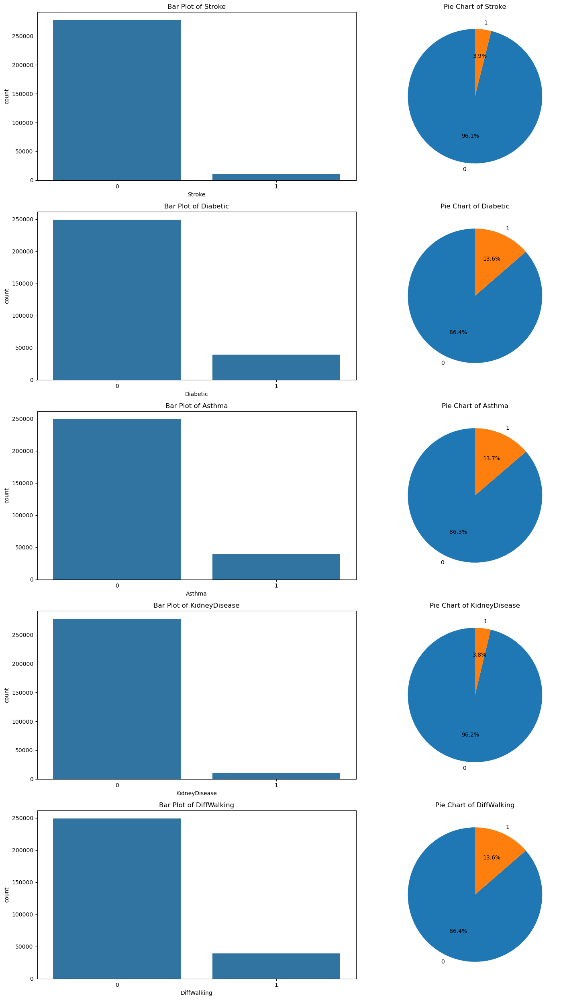

In [18]:
variables = ['Stroke', 'Diabetic', 'Asthma', 'KidneyDisease', 'DiffWalking']

# Setup figure and axes
f, axes = plt.subplots(len(variables), 2, figsize=(16, 5 * len(variables)))  # Allocate enough space

for i, var in enumerate(variables):
    # Bar plot
    sns.countplot(x=var, data=df_clean, ax=axes[i, 0])
    axes[i, 0].set_title(f'Bar Plot of {var}')

    # Pie chart
    counts = df_clean[var].value_counts()
    axes[i, 1].pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=90)
    axes[i, 1].set_title(f'Pie Chart of {var}')
    axes[i, 1].set_ylabel('')  # Hide the y-label because it's not informative for pie charts

plt.tight_layout()
plt.show()

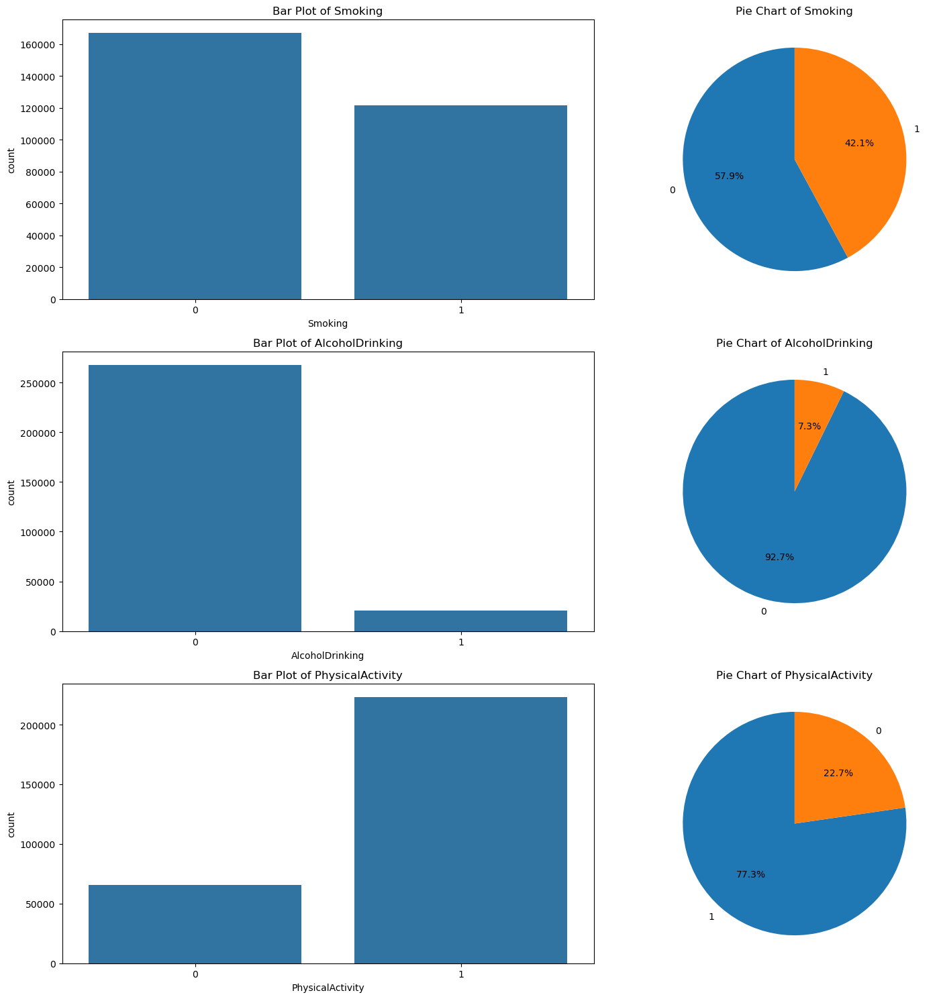

In [19]:
variables = ['Smoking', 'AlcoholDrinking', 'PhysicalActivity']

# Setup figure and axes
f, axes = plt.subplots(len(variables), 2, figsize=(16, 5 * len(variables)))  # Allocate enough space

for i, var in enumerate(variables):
    # Bar plot
    sns.countplot(x=var, data=df_clean, ax=axes[i, 0])
    axes[i, 0].set_title(f'Bar Plot of {var}')

    # Pie chart
    counts = df_clean[var].value_counts()
    axes[i, 1].pie(counts, labels=counts.index, autopct='%1.1f%%', startangle=90)
    axes[i, 1].set_title(f'Pie Chart of {var}')
    axes[i, 1].set_ylabel('')  # Hide the y-label because it's not informative for pie charts

plt.tight_layout()
plt.show()

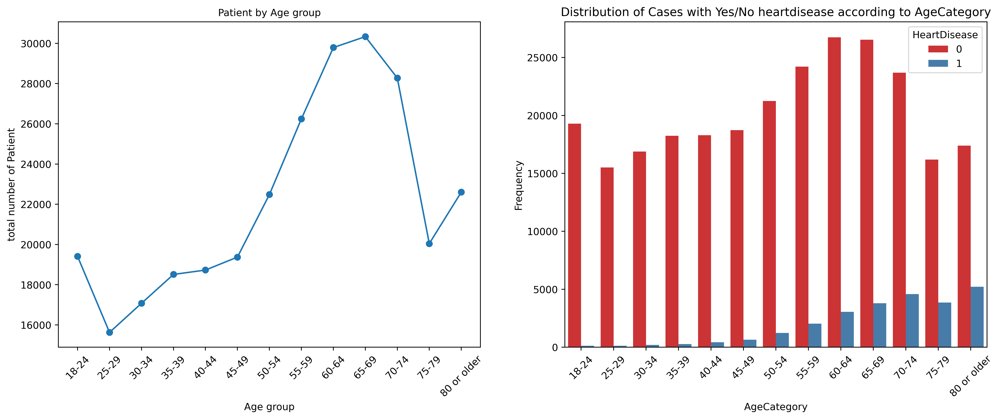

In [20]:
age_plot = df.groupby(["AgeCategory"])
Patient_groupby_age= {}
for age, group in age_plot:
    Patient_groupby_age[age]=(group["AgeCategory"].count())


x_axis = np.arange(0, len(Patient_groupby_age.keys()) ) 
ageCategory_order =['18-24', '25-29', '30-34','35-39', '40-44', '45-49', '50-54', '55-59', '60-64', '65-69', '70-74','75-79', '80 or older'] 
fig , axes= plt.subplots(1,2, figsize=(17,6),dpi=500)
ax=plt.subplot(1,2,1 )    
ax0=plt.plot(x_axis, Patient_groupby_age.values(), marker="o")
ax.set_xticks(x_axis)
ax.set_xticklabels(ageCategory_order)
plt.title("Patient by Age group",size=10,)
plt.xlabel("Age group")
plt.ylabel("total number of Patient")
plt.xticks(rotation=45)



ax=plt.subplot(1,2,2 )     
order = pd.unique(df.AgeCategory.values)
order.sort()
ax1=sns.countplot(data=df, x='AgeCategory', hue='HeartDisease', palette='Set1', order=order)
plt.title("Distribution of Cases with Yes/No heartdisease according to AgeCategory")
plt.xlabel('AgeCategory')
ax.set_xticks(x_axis)
ax.set_xticklabels(ageCategory_order)
plt.ylabel('Frequency')
plt.xticks(rotation=45)
plt.show() 

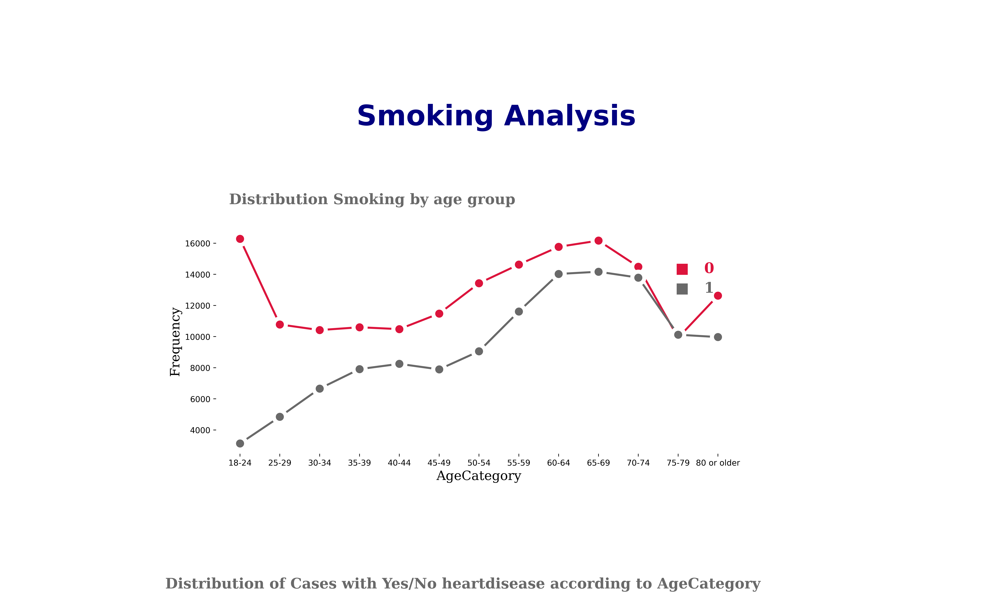

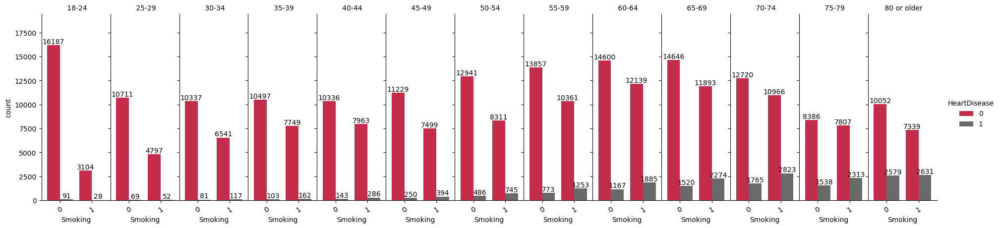

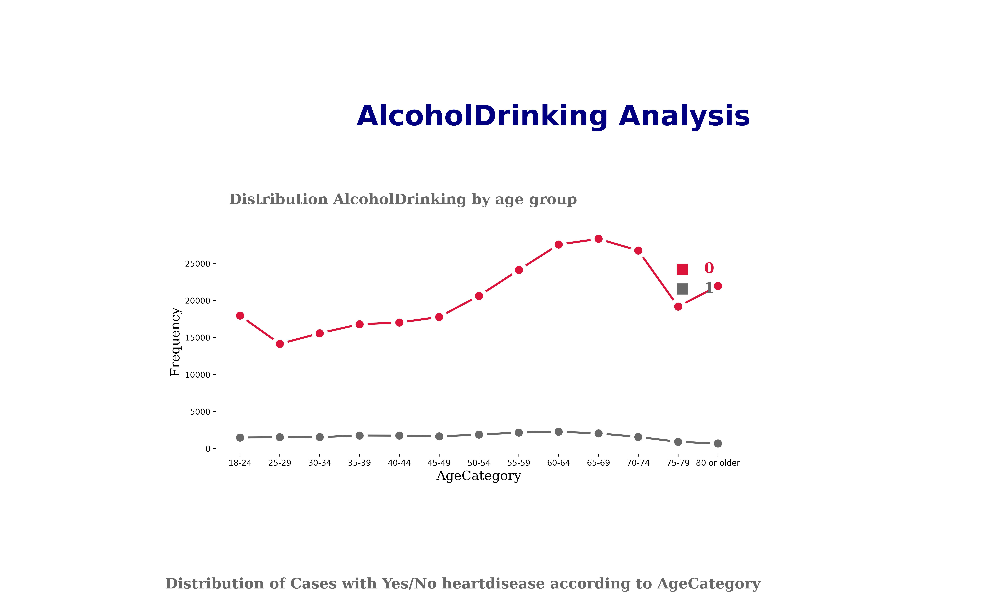

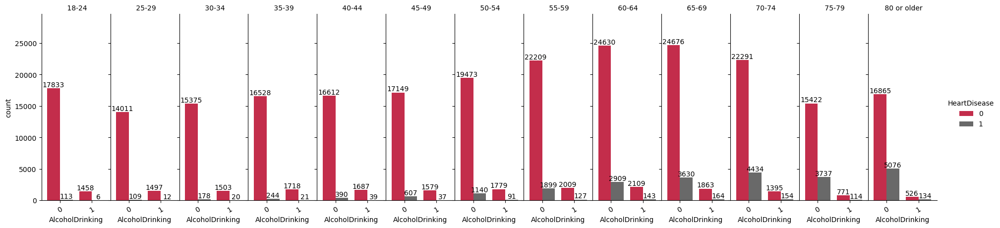

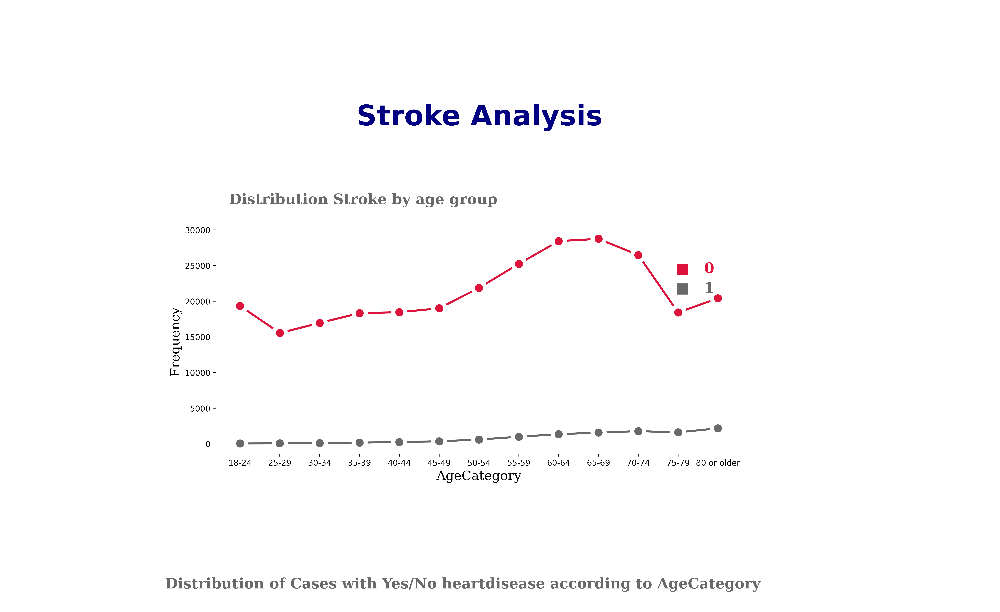

...

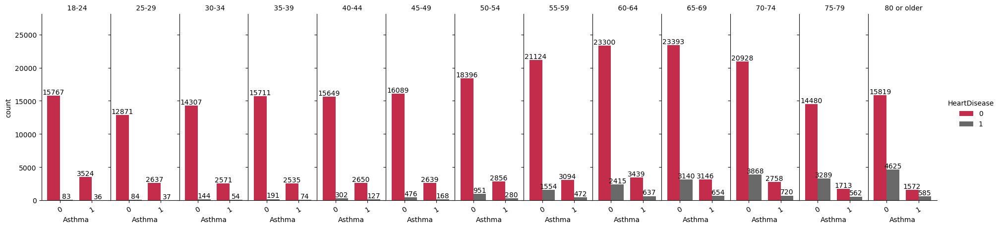

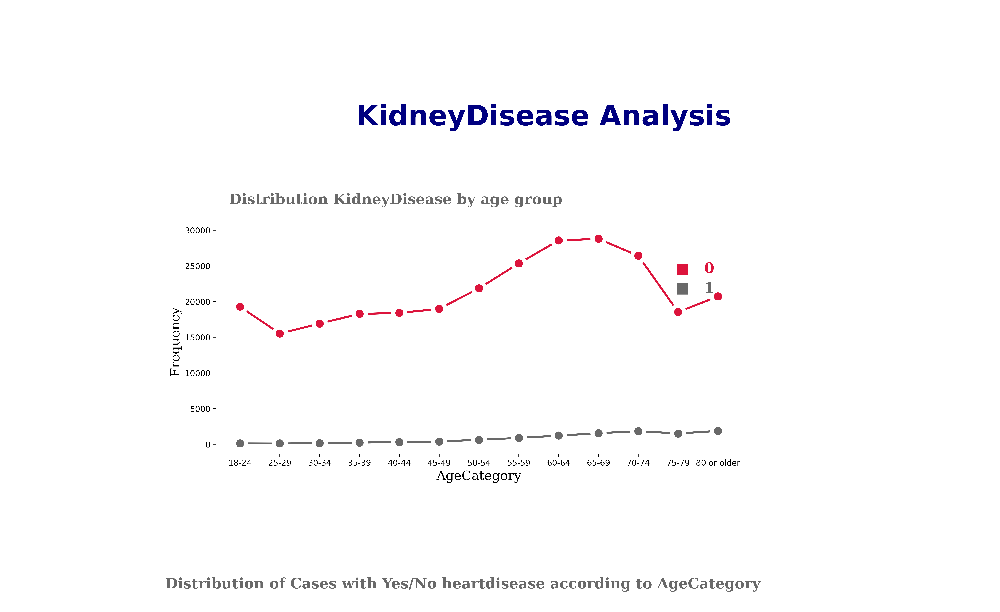

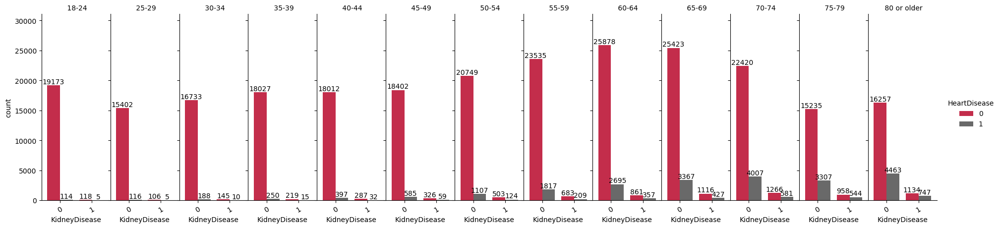

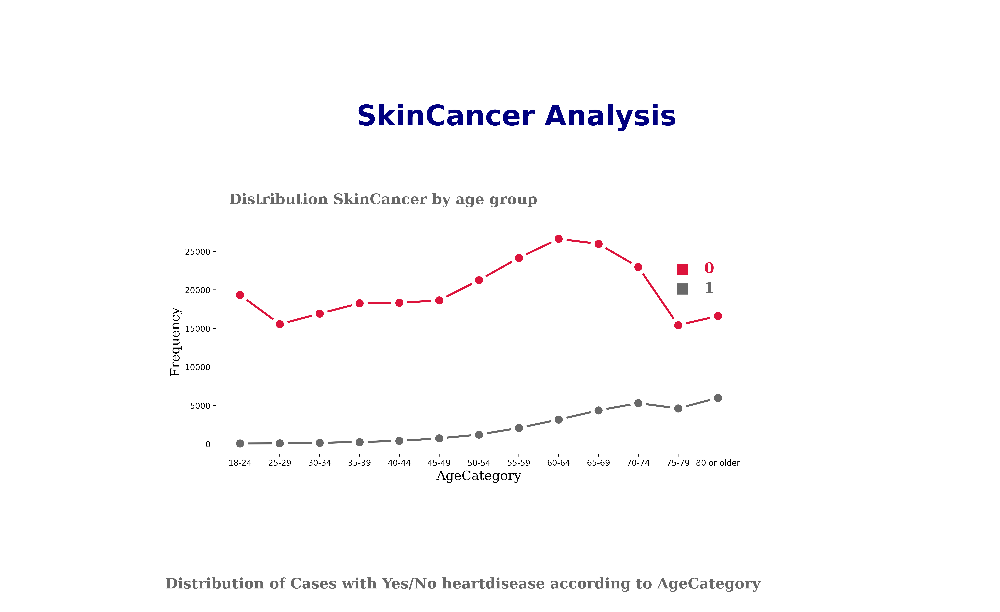

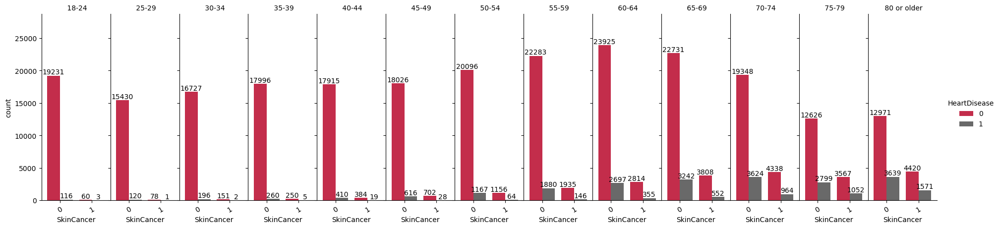

In [21]:
color_catplot=["Crimson","DimGray"]
column_name=[ 'Smoking', 'AlcoholDrinking', 'Stroke', 'DiffWalking', 'Sex','PhysicalActivity','Asthma', 'KidneyDisease', 'SkinCancer'] 
df_sorted=df.sort_values('AgeCategory')
X_tuple=tuple(tuple (x_axis))

for column in column_name:

    fig = plt.figure(figsize = (22,17),dpi=500)

    gs = fig.add_gridspec(10,24)
    gs.update(wspace = 1, hspace = 0.05)
    
    ax2 = fig.add_subplot(gs[0:3,5:18]) #distribution plot
    ax1 = fig.add_subplot(gs[4:5,0:]) #dumbbell plot

    # axes list
    axes = [ax1,ax2]

    # setting of axes; visibility of axes and spines turn off
    for ax in axes:
        ax.axes.get_yaxis().set_visible(False)
        ax.set_facecolor('#FFFFFF')
    
        for loc in ['left', 'right', 'top', 'bottom']:
            ax.spines[loc].set_visible(False)

    fig.patch.set_facecolor('#FFFFFF')
        
    ax1.axes.get_xaxis().set_visible(False)
    ax2.axes.get_yaxis().set_visible(True)
    ax1.set_xlim(xmin = -250,xmax = 2000)
    ax1.set_ylim(ymin = -1,ymax =3.5)

    # catplot

    g=sns.catplot(x=column , hue="HeartDisease", col="AgeCategory",data=df_sorted,
                kind="count", height=5, aspect=.3, palette=color_catplot, ax=ax1)
    
    for ax in g.axes.flat[1:]:
        sns.despine(ax=ax, left=False)
    for ax in g.axes.flat:
        ax.set_xlabel(ax.get_title())
        ax.set_title('')
        ax.margins(x=0.1) # slightly more margin as a separation
        ax.tick_params(axis='x', labelrotation=30)
    for ax in g.axes.ravel():
    
        # add annotations
        for c in ax.containers:
            # add custom labels with the labels=labels parameter if needed
            # labels = [f'{h}' if (h := v.get_height()) > 0 else '' for v in c]
            ax.bar_label(c, label_type='edge')
        ax.margins(y=0.2)   

        #title for each     
    g.set_titles( col_template=' {col_name}')
    
    plt.subplots_adjust(wspace=0, bottom=0.18, left=0.06)

        #Remove lable form below of each 
    g.set_xlabels()

    # lineplot
    column_plot_first =   df[df[column] == 0]['AgeCategory'].value_counts().sort_index(axis = 0)
    column_plot_second= df[df[column] == 1]['AgeCategory'].value_counts().sort_index(axis = 0)
    
    sns.lineplot( column_plot_first, marker="o", color="Crimson", linewidth = 2.5,ms=15,mew=5 ,ax = ax2)
    sns.lineplot( column_plot_second, marker="o", color="DimGray",linewidth = 2.5,ms=15,mew=5, ax = ax2)
    
    ax2.set_xlabel('AgeCategory', fontdict = {'font':'Serif', 'color': 'black', 'size': 16 })
    ax2.set_xticks(x_axis)
    ax2.set_xticklabels(ageCategory_order)
    ax2.set_ylabel('Frequency',fontdict = {'font':'Serif', 'color': 'black', 'size': 16})
       

    fig.text(0.4,0.985, column +" Analysis" ,{'weight':'bold','color': 'Navy', 'size':35})
    fig.text(0.4, 1.1, " ")
    fig.text(0.65,0.835, '■   0 ', {'font': 'Serif','weight':'bold','size': '18','weight':'bold','style':'normal', 'color':"Crimson"})
    fig.text(0.65,0.815, '■   1', {'font': 'Serif','weight':'bold','size': '18','weight':'bold','style':'normal', 'color':"DimGray"})
    fig.text(0.3,0.905, 'Distribution '+column+' by age group', {'font': 'Serif','weight':'bold','size': '18','weight':'bold','style':'normal', 'color':"DimGray"})
    fig.text(0.25,0.515, 'Distribution of Cases with Yes/No heartdisease according to AgeCategory', {'font': 'Serif','weight':'bold','size': '18','weight':'bold','style':'normal', 'color':"DimGray"})
    
    fig.show()

In [24]:
dk = df.copy()
dk.Stroke = dk.Stroke.apply(lambda x : 'Stroke' if x == 1 else 'No Stroke')
dk.DiffWalking = dk.DiffWalking.apply(lambda x : 'DiffWalking' if x == 1 else 'CanWalk')
dk.Diabetic = dk.Diabetic.apply(lambda x : 'Diabetic' if x == 1 else 'No Diabetic')
dk.Asthma = dk.Asthma.apply(lambda x : 'Asthma' if x == 1 else 'No Asthma')
dk.KidneyDisease = dk.KidneyDisease.apply(lambda x : 'KidneyDisease' if x == 1 else 'No KidneyDisease')
dk.SkinCancer = dk.SkinCancer.apply(lambda x: 'SkinCancer' if x == 1 else 'No SkinCancer')
dk.drop(["BMI","Smoking","AlcoholDrinking","PhysicalHealth","MentalHealth","Sex","AgeCategory","Race","PhysicalActivity","GenHealth","SleepTime"],axis=1, inplace=True)

from itertools import chain, combinations

Risky_patient = ["Stroke", "DiffWalking", "Diabetic", "Asthma", "KidneyDisease", "SkinCancer"]
Total_bar=0
tmp = []
for i in range(len(Risky_patient)):
    oc = combinations(Risky_patient, i + 1)
    for c in oc:
        tmp.append(list(c))
        Total_bar+=1

#2 Factor
dk['St_Dif'] = dk[tmp[6][0]] + ' & ' + dk[tmp[6][1]]
dk['St_Dia'] = dk[tmp[7][0]] + ' & ' + dk[tmp[7][1]]
dk['St_As'] = dk[tmp[8][0]] + ' & ' + dk[tmp[8][1]]
dk['ST_Ki'] = dk[tmp[9][0]] + ' & ' + dk[tmp[9][1]]
dk['ST_Sk'] = dk[tmp[10][0]] + ' & ' + dk[tmp[10][1]]

dk['Dif_Dia'] = dk[tmp[11][0]] + ' & ' + dk[tmp[11][1] ]
dk['Dif_As'] = dk[tmp[12][0]] + ' & ' + dk[tmp[12][1]]
dk['Dif_Ki'] = dk[tmp[13][0]] + ' & ' + dk[tmp[13][1]]
dk['Dif_Sk'] = dk[tmp[14][0]] + ' & ' + dk[tmp[14][1]]

dk['Dia_As'] = dk[tmp[15][0]] + ' & ' + dk[tmp[15][1]]
dk['Dia_Ki'] = dk[tmp[16][0]] + ' & ' + dk[tmp[16][1]]                                         
dk['Dia_Sk'] = dk[tmp[17][0]] + ' & ' + dk[tmp[17][1]]                                         

dk['As_Ki'] = dk[tmp[18][0]] + ' & ' + dk[tmp[18][1]]
dk['As_St'] = dk[tmp[19][0]] + ' & ' + dk[tmp[19][1]]

dk['Ki_Sk'] = dk[tmp[20][0]] + ' & ' + dk[tmp[20][1]] 

#3 Factor
dk['St_Dif_Dia'] = dk[tmp[21][0]] + ' & ' + dk[tmp[21][1]]+ ' & ' +dk[tmp[21][2]]
dk['St_Dif_As'] = dk[tmp[22][0]] + ' & ' + dk[tmp[22][1]]+ ' & ' +dk[tmp[22][2]]
dk['St_Dif_Ki'] = dk[tmp[23][0]] + ' & ' + dk[tmp[23][1]]+ ' & ' +dk[tmp[23][2]]
dk['ST_Dia_As'] = dk[tmp[24][0]] + ' & ' + dk[tmp[24][1]]+ ' & ' +dk[tmp[24][2]]
dk['St_Dia_Ki'] = dk[tmp[25][0]] + ' & ' + dk[tmp[25][1]]+ ' & ' +dk[tmp[25][2]]
dk['St_As_ki'] = dk[tmp[26][0]] + ' & ' + dk[tmp[26][1]]+ ' & ' +dk[tmp[26][2]]
dk['Dif_Dia_As'] = dk[tmp[27][0]] + ' & ' + dk[tmp[27][1]]+ ' & ' +dk[tmp[27][2]]                                           
dk['Dif_Dia_Ki'] = dk[tmp[28][0]] + ' & ' + dk[tmp[28][1]]+ ' & ' +dk[tmp[28][2]]
dk['Dif_As_ki'] = dk[tmp[29][0]] + ' & ' + dk[tmp[29][1]]+ ' & ' +dk[tmp[29][2]]                                       
dk['Dia_As_Ki'] = dk[tmp[30][0]] + ' & ' + dk[tmp[30][1]]+ ' & ' +dk[tmp[30][2]] 



#4 Factor
dk['St_Dif_Dia_As'] = dk[tmp[41][0]] + ' & ' + dk[tmp[41][1]] + ' & ' + dk[tmp[41][2]]+ ' & ' + dk[tmp[41][3]]
dk['St_Dif_Dia_ki'] =dk[tmp[42][0]] + ' & ' + dk[tmp[42][1]] + ' & ' + dk[tmp[42][2]]+ ' & ' + dk[tmp[42][3]]
dk['St_Dif_As_ki'] = dk[tmp[43][0]] + ' & ' + dk[tmp[43][1]] + ' & ' + dk[tmp[43][2]]+ ' & ' + dk[tmp[43][3]]
dk['ST_Dia_As_Ki'] = dk[tmp[44][0]] + ' & ' + dk[tmp[44][1]] + ' & ' + dk[tmp[44][2]]+ ' & ' + dk[tmp[44][3]]
dk['Dif_Dia_As_Ki'] = dk[tmp[45][0]] + ' & ' + dk[tmp[45][1]] + ' & ' + dk[tmp[45][2]]+ ' & ' + dk[tmp[45][3]] 

                                           
#5 Factor                                           
dk['St_Dif_Dia_As_Ki'] = dk[tmp[56][0]] + ' & ' + dk[tmp[56][1]] + ' & ' + dk[tmp[56][2]] + ' & ' + dk[tmp[56][3]] + ' & ' + dk[tmp[56][4]] 


dk['St_Di_As_Ki_Sk_DW'] = dk[tmp[62][0]] + ' & ' + dk[tmp[62][1]] + ' & ' + dk[tmp[62][2]] + ' & ' + dk[tmp[62][3]] + ' & ' + dk[tmp[62][4]] + ' & ' + dk[tmp[62][5]]

df_plot_risky_patient=pd.DataFrame()
list_item=dk.drop("HeartDisease",axis=1).columns

for item in list_item:
    
    df_plot_risky_patient1 = dk.groupby(item)['HeartDisease'].value_counts(normalize = True).mul(100)
    df_plot_risky_patient1 = df_plot_risky_patient1.rename('percent').reset_index()
    
    df_plot_risky_patient = pd.concat([df_plot_risky_patient,df_plot_risky_patient1.rename(columns={item:'Smoking'})], ignore_index=True)

df_risky_patient = df_plot_risky_patient[df_plot_risky_patient["HeartDisease"] == 1].reset_index()
df_selected = df_risky_patient[['Smoking', 'percent']].rename(columns={'Smoking': '','percent':'Percentage'})
df_styled = df_selected.style.format({'Percentage': '{:.2f}%'}).set_properties(**{'text-align': 'left'})

# Display the styled DataFrame
df_styled

,,Percentage
0,No Stroke,7.76%
1,Stroke,35.74%
2,CanWalk,6.68%
3,DiffWalking,22.59%
4,Diabetic,20.81%
5,No Diabetic,6.96%
6,Asthma,11.14%
7,No Asthma,8.48%
8,KidneyDisease,28.74%
9,No KidneyDisease,8.07%


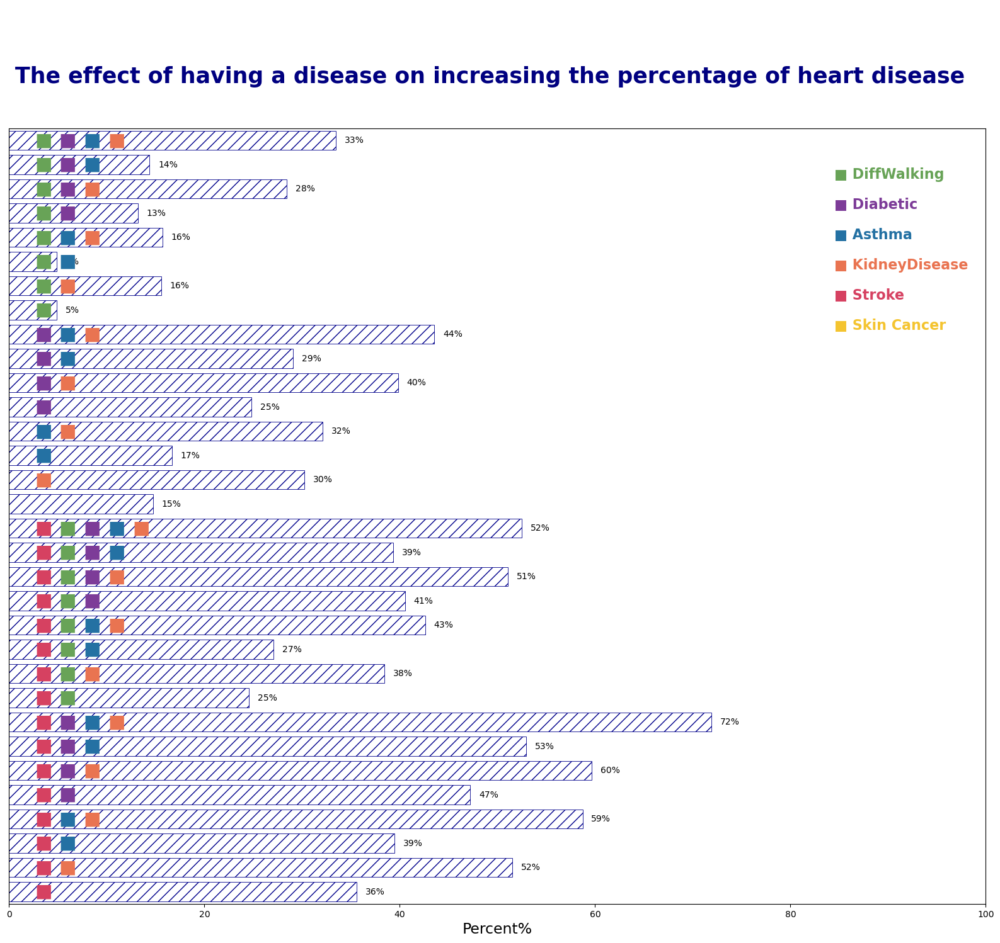

In [25]:
df_plot_risky_patient_prec= dk.groupby("St_Dif_Dia_As_Ki")['HeartDisease'].value_counts(normalize = True).mul(100)
df_plot_risky_patient_prec = df_plot_risky_patient_prec.rename('percent').reset_index()
    
pd.options.display.max_colwidth  = 999

df_precent=df_plot_risky_patient_prec[df_plot_risky_patient_prec["HeartDisease"]==1]

df_precent
fig, ax = plt.subplots(1, 1,figsize =(20, 16))
ax = sns.barplot(y = df_precent["St_Dif_Dia_As_Ki"], x= df_precent["percent"], 
                orient='h',color="white", hatch='//',edgecolor="darkblue",ecolor="black", linewidth=0.6,)


ax.bar_label(ax.containers[0], fmt='%.f%%', padding=10)

colors = {
    'Stroke': '#D64161',  # Deep Carmine Pink
    'DiffWalking': '#68A357',  # Verdant Green
    'Diabetic': '#7D3C98',  # Majestic Purple
    'Asthma': '#2471A3',  # Ocean Blue
    'KidneyDisease': '#E97451',  # Burnt Sienna
    'SkinCancer' : '#F4C430'
}

y=0


axes=[
    ["DiffWalking" , "Diabetic" , "Asthma" , "KidneyDisease"],
     [ "DiffWalking" , "Diabetic" , "Asthma" ],
     [ "DiffWalking" , "Diabetic" ,  "KidneyDisease"],
     [  "DiffWalking" , "Diabetic"],
     [  "DiffWalking" ,  "Asthma" , "KidneyDisease"],
    [  "DiffWalking"  , "Asthma" ],
     [  "DiffWalking" ,  "KidneyDisease"],
     [   "DiffWalking"],
     [   "Diabetic" , "Asthma" , "KidneyDisease"],
     [  "Diabetic" , "Asthma"],
     [  "Diabetic" ,  "KidneyDisease"],
     [  "Diabetic"  ],
     [   "Asthma" , "KidneyDisease"],
     [   "Asthma" ],
     [  "KidneyDisease"],
     [ ],
     ["Stroke" , "DiffWalking" , "Diabetic" , "Asthma" , "KidneyDisease"],
     ["Stroke" , "DiffWalking" , "Diabetic" , "Asthma"],
     ["Stroke" , "DiffWalking" , "Diabetic" ,  "KidneyDisease"],
     ["Stroke" , "DiffWalking" , "Diabetic" ],
     ["Stroke" , "DiffWalking"  , "Asthma" , "KidneyDisease"],
     ["Stroke" , "DiffWalking" , "Asthma"],
     ["Stroke" , "DiffWalking" , "KidneyDisease"],
     ["Stroke" , "DiffWalking"],
     ["Stroke" ,  "Diabetic" , "Asthma" , "KidneyDisease"],
     ["Stroke" ,  "Diabetic" , "Asthma"],
     ["Stroke" ,  'Diabetic'   , "KidneyDisease"],
     ["Stroke" ,  "Diabetic" ],
     ["Stroke" ,  "Asthma" , "KidneyDisease"],
     ["Stroke" ,   "Asthma" , ],
     ["Stroke"  , "KidneyDisease"],
     ["Stroke"  ],
    ["Stroke" , "DiffWalking" , "Diabetic" , "Asthma" , "KidneyDisease", "SkinCancer"]

]


for axo in axes:
    x=3.5
    for i in axo:
        ax.annotate('■', ha='center', va='center', fontsize=21, color=colors[i], xy=(x, y))
        x+=2.5
    y+=1
ax.set_xlabel('Percent%', size=17)
ax.axes.get_yaxis().set_visible(False)
ax.set(xlim=(0, 100))

fig.text(0.78,0.83, '■ DiffWalking', {'weight':'bold','size': '16','weight':'bold','style':'normal', 'color':colors['DiffWalking']} )
fig.text(0.78,0.8,'■ Diabetic', {'weight':'bold','size': '16','weight':'bold','style':'normal', 'color':colors['Diabetic']})
fig.text(0.78,0.77, '■ Asthma', {'weight':'bold','size': '16','weight':'bold','style':'normal', 'color':colors['Asthma']})
fig.text(0.78,0.74, '■ KidneyDisease', {'weight':'bold','size': '16','weight':'bold','style':'normal', 'color':colors['KidneyDisease']})
fig.text(0.78,0.71,'■ Stroke', {'weight':'bold','size': '16','weight':'bold','style':'normal', 'color':colors['Stroke']} )
fig.text(0.78,0.68,'■ Skin Cancer', {'weight':'bold','size': '16','weight':'bold','style':'normal', 'color':colors['SkinCancer']} )

fig.text(0.13,0.925,'The effect of having a disease on increasing the percentage of heart disease',{'weight':'bold','color': 'Navy', 'size':25})
fig.text(0.20,0.99, ' ', {'size':'16','color': 'black'})
plt.show()


In [26]:
dk_a = df.copy()
dk_a.Smoking = dk_a.Smoking.apply(lambda x : 'Smoking' if x == 1 else 'Non Smoking')
dk_a.AlcoholDrinking = dk_a.AlcoholDrinking.apply(lambda x : 'AlcoholDrinking' if x == 1 else 'Non AlcoholDrinking')
dk_a.PhysicalActivity = dk_a.PhysicalActivity.apply(lambda x : 'Active' if x == 1 else 'Inactive')

dk_a.drop(["BMI","Stroke","DiffWalking","Diabetic","MentalHealth","PhysicalHealth","Sex","AgeCategory","Race","Asthma","GenHealth","SleepTime","SkinCancer","KidneyDisease"],axis=1, inplace=True)

from itertools import chain, combinations

Risky_Activity = ["Smoking" , "AlcoholDrinking"  , "PhysicalActivity" ]
Total_bar2=0
tmp2 = []
for i in range(len(Risky_Activity)):
    oc = combinations(Risky_Activity, i + 1)
    for c in oc:
        tmp2.append(list(c))
        Total_bar2+=1

#print(Total_bar2)

#2 Factor
dk_a['Sm_Al'] = dk_a[tmp2[3][0]] + ' & ' + dk_a[tmp2[3][1]]
dk_a['Sm_Ph'] = dk_a[tmp2[4][0]] + ' & ' + dk_a[tmp2[4][1]]
dk_a['Al_Ph'] = dk_a[tmp2[5][0]] + ' & ' + dk_a[tmp2[5][1]]


#3 Factor
dk_a['Sm_Al_Ph'] = dk_a[tmp2[6][0]] + ' & ' + dk_a[tmp2[6][1]]+ ' & ' +dk_a[tmp2[6][2]]

df_plot_risky_Activity_prec= dk_a.groupby("Sm_Al_Ph")['HeartDisease'].value_counts(normalize = True).mul(100)
df_plot_risky_Activity_prec = df_plot_risky_Activity_prec.rename('percent').reset_index()
    
pd.options.display.max_colwidth  = 999

df_A_precent=df_plot_risky_Activity_prec[df_plot_risky_patient_prec["HeartDisease"]==1]

df_A_precent

,Sm_Al_Ph,HeartDisease,percent
1,Non Smoking & AlcoholDrinking & Active,1,2.440425
3,Non Smoking & AlcoholDrinking & Inactive,1,5.748175
5,Non Smoking & Non AlcoholDrinking & Active,1,5.624446
7,Non Smoking & Non AlcoholDrinking & Inactive,1,10.033328
9,Smoking & AlcoholDrinking & Active,1,5.231915
11,Smoking & AlcoholDrinking & Inactive,1,10.456853
13,Smoking & Non AlcoholDrinking & Active,1,11.185634
15,Smoking & Non AlcoholDrinking & Inactive,1,17.838072


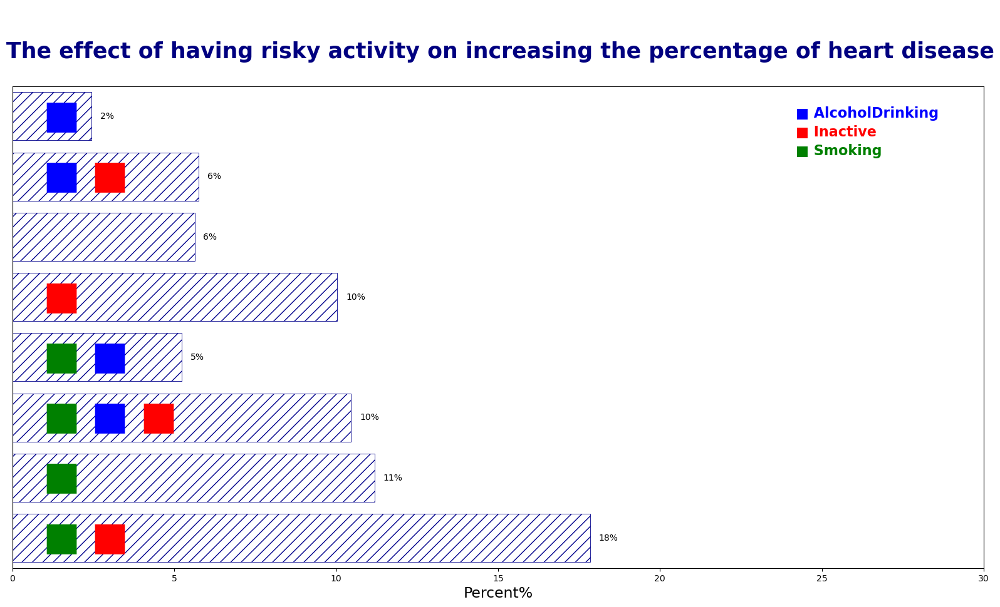

In [27]:
fig, ax = plt.subplots(1, 1,figsize =(20, 10))
ax = sns.barplot(y = df_A_precent["Sm_Al_Ph"], x= df_A_precent["percent"], 
                orient='h',color="white", hatch='//',edgecolor="darkblue",ecolor="black", linewidth=0.6,)


ax.bar_label(ax.containers[0], fmt='%.f%%', padding=10)
colors={
    'AlcoholDrinking':'Blue',
    'Inactive':'red',
    'Smoking':'green'
}
y=0

axes=[
    ["AlcoholDrinking"],
     [ "AlcoholDrinking" , "Inactive"  ],
     [ ],
     [  "Inactive"],
     [  "Smoking" ,  "AlcoholDrinking" ],
    [  "Smoking"  , "AlcoholDrinking", "Inactive" ],
     [  "Smoking" ],
     [   "Smoking", "Inactive"],
]

for axo in axes:
    x=1.5
    for i in axo:
        ax.annotate('■', ha='center', va='center', fontsize=45, color=colors[i], xy=(x, y))
        x+=1.5
    y+=1
ax.set_xlabel('Percent%', size=17)
ax.axes.get_yaxis().set_visible(False)
ax.set(xlim=(0, 30))

fig.text(0.75,0.83, '■ AlcoholDrinking', {'weight':'bold','size': '16','weight':'bold','style':'normal', 'color':colors['AlcoholDrinking']} )
fig.text(0.75,0.8,'■ Inactive', {'weight':'bold','size': '16','weight':'bold','style':'normal', 'color':colors['Inactive']})
fig.text(0.75,0.77, '■ Smoking', {'weight':'bold','size': '16','weight':'bold','style':'normal', 'color':colors['Smoking']})


fig.text(0.12,0.925,'The effect of having risky activity on increasing the percentage of heart disease',{'weight':'bold','color': 'Navy', 'size':25})
fig.text(0.20,0.99, ' ', {'size':'16','color': 'black'})
plt.show()

## Split Dataset for Training and Testing

In [30]:
x,y = df_clean.drop(["HeartDisease"], axis=1), df_clean["HeartDisease"]
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=0)

df.to_csv('df_clean_wo_labelEncoding.csv', index=False)
df_clean.to_csv('df_clean.csv', index=False)
x_train.to_csv('x_train.csv', index=False)
y_train.to_csv('y_train.csv', index=False)
x_test.to_csv('x_test.csv', index=False)
y_test.to_csv('y_test.csv', index=False)

---